# Generate cosine similarity histograms
1. By Class
2. By Modality

side-by-side siglip vs sigl2

In [207]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import torch
import torch.nn.functional as F
from PIL import Image
import os
import json
from tqdm import tqdm

# Set style
plt.style.use('default')
sns.set_palette("husl")

device = "cpu"# "cuda" if torch.cuda.is_available() else "cpu"

## Load pre-extracted siglip and sigl2 embeds

In [208]:
siglip_img_embeds = torch.load('/home/jonas/workspace/Cross-the-Gap/data/image_features/imagenet/siglip-ViT-B-16//image_features.pt', map_location=torch.device(device)) #ViT-B16
siglip_txt_embeds = torch.load('/home/jonas/workspace/Cross-the-Gap/data/text_features/siglip-ViT-B-16/imagenet', map_location=torch.device(device))
sigl2_img_embeds = torch.load('/home/jonas/workspace/Cross-the-Gap/data/image_features/imagenet/siglip2-ViT-B-16/image_features.pt', map_location=torch.device(device)) #ViT-B16
sigl2_txt_embeds = torch.load('/home/jonas/workspace/Cross-the-Gap/data/text_features/siglip2-ViT-B-16/imagenet', map_location=torch.device(device))
# sigl2_img_embeds = torch.load('/home/jonas/workspace/challenging/imagenet_dino2_txt_image_embeds', map_location=torch.device(device))
# sigl2_txt_embeds = torch.load('/home/jonas/workspace/challenging/imagenet_dinov2_txt_text_embeds', map_location=torch.device(device))

print(siglip_img_embeds.shape, siglip_txt_embeds.shape, sigl2_img_embeds.shape, sigl2_txt_embeds.shape)

torch.Size([50000, 768]) torch.Size([1000, 768]) torch.Size([50000, 768]) torch.Size([1000, 768])


In [209]:
# 50k samples, 1k classes, 50 samples/class
labels = torch.tensor([[i]*50 for i in range(1000)]).flatten()

In [210]:
# sample only a few to save RAM
def sample_random_idcs(nel, ratio=1/25000):
    # sample without replacement (torch.randint would result in duplicate indices)
    size = int(nel*ratio)
    return torch.randperm(nel)[:size]

indices_selected = sample_random_idcs(len(siglip_img_embeds), ratio=1/10)

siglip_img_embeds = siglip_img_embeds[indices_selected]
sigl2_img_embeds = sigl2_img_embeds[indices_selected]
labels = labels[indices_selected]

siglip_img_embeds.shape, sigl2_img_embeds.shape, labels.shape

(torch.Size([5000, 768]), torch.Size([5000, 768]), torch.Size([5000]))

## Create similarity matrices

In [211]:
siglip_embs = F.normalize(siglip_img_embeds)
sigl2_embs = F.normalize(sigl2_img_embeds)
siglip_txt_embeds = F.normalize(siglip_txt_embeds)
sigl2_txt_embeds = F.normalize(sigl2_txt_embeds)

simmat_siglip = siglip_embs @ siglip_embs.T # ~2GB
simmat_siglip = simmat_siglip.cpu()

simmat_sigl2 = sigl2_embs @ sigl2_embs.T# ~2GB
simmat_sigl2 = simmat_sigl2.cpu()

print(simmat_siglip.shape, simmat_sigl2.shape)

torch.Size([5000, 5000]) torch.Size([5000, 5000])


In [275]:
 def remove_outliers(data, method='iqr', threshold=1.5):
        """Remove outliers from a single dataset"""
        if method == 'iqr':
            Q1 = np.percentile(data, 25)
            Q3 = np.percentile(data, 75)
            IQR = Q3 - Q1
            lower_bound = Q1 - threshold * IQR
            upper_bound = Q3 + threshold * IQR
        elif method == 'std':
            mean = np.mean(data)
            std = np.std(data)
            lower_bound = mean - threshold * std
            upper_bound = mean + threshold * std
        else:
            raise ValueError("Method must be 'iqr' or 'std'")
        
        # Keep only data within bounds
        mask = (data >= lower_bound) & (data <= upper_bound)
        return data[mask]#, lower_bound, upper_bound
     
def group_sims_by_class(simmat, labels):
    # labels: (N)
    # simmat: (N,N)
    identity_mask = torch.eye(len(labels)) > 0 # (N,N)
    eq_mask = simmat > 0.99 # (N,N)
    zero_mask = simmat==0 # exact zero means it has been masked, e.g. lower triu (N,N)
    equal_class_mask = labels.unsqueeze(0) == labels.unsqueeze(1) # (N,N)
    return (simmat[equal_class_mask & ~identity_mask & ~eq_mask & ~zero_mask], 
            simmat[~equal_class_mask & ~identity_mask & ~eq_mask & ~zero_mask])

def calc_sims_by_modality(image_embs, text_embs, labels):
    identity_mask = torch.eye(len(labels)) > 0
    intermodal_sim = image_embs @ text_embs.T
    intramodal_sim = image_embs @ image_embs.T
    eq_mask = intramodal_sim > 0.99
    return intermodal_sim.flatten(), intramodal_sim[~identity_mask & ~eq_mask]

In [213]:
# by class
by_class_sims_siglip = group_sims_by_class(simmat_siglip, labels)
by_class_sims_sigl2 = group_sims_by_class(simmat_sigl2, labels)
# by modality
by_mod_sims_siglip = calc_sims_by_modality(siglip_embs, siglip_txt_embeds, labels)
by_mod_sims_siglip = remove_outliers(by_mod_sims_siglip[0]), remove_outliers(by_mod_sims_siglip[1])
by_mod_sims_sigl2 = calc_sims_by_modality(sigl2_embs, sigl2_txt_embeds, labels)
by_mod_sims_sigl2 = remove_outliers(by_mod_sims_sigl2[0]), remove_outliers(by_mod_sims_sigl2[1])

## Plot functions

In [340]:
import plotly.express as px
import pandas as pd
import plotly.graph_objects as go

def plot_by_class(sameclass_sims, otherclass_sims, max_samples=400000, title=None):
    # Create DataFrame in long format
    n_samples_plot = min(len(sameclass_sims), len(otherclass_sims), max_samples)
    
    same_class = sameclass_sims.view(-1)[:n_samples_plot].cpu().numpy()
    other_class = otherclass_sims.view(-1)[:n_samples_plot].cpu().numpy()
    print(len(same_class), len(other_class), n_samples_plot)
    
    data = pd.DataFrame({
        'values': np.concatenate([same_class, other_class]),
        'category': ['same class'] * n_samples_plot + ['other class'] * n_samples_plot
    })
    
    # Professional color scheme (colorblind friendly)
    colors = ['#1f77b4', '#ff7f0e']  # Blue and orange
    
    fig = px.histogram(data, x='values', color='category',
                       barmode='overlay', opacity=0.7, nbins=500,
                       color_discrete_sequence=colors,)
                       #histnorm='probability density')  # Change to density

    # Professional styling
    fig.update_layout(
        font=dict(
            family="Arial, sans-serif",
            size=28,
            color="#000000"
        ),
        title=dict(
            text=title if title else "Class Similarity Distributions",
            x=0.5,
            xanchor='center',
            font=dict(size=36, color='black')
        ) if title is not None else None,
        xaxis=dict(
            title=dict(
                text="Cosine Similarity",
                font=dict(size=32)
            ),
            gridcolor='lightgray',
            gridwidth=1,
            zeroline=False,  # Remove the vertical bar at 0
        ),
        yaxis=dict(
            title=dict(
                text="Sample Density",
                font=dict(size=28)  # Changed from "Frequency" to "Density"     
            ),
            #range=[0,7], # remove this if you want auto-range
            gridcolor='lightgray',
            gridwidth=1
        ),
        legend=dict(
            title=dict(
                text="",
                font=dict(size=36)
            ),
            font=dict(size=36),
            bgcolor='white',
            #bordercolor='black',
            #borderwidth=1,
            #xanchor='right',  # Anchor to right edge
            #yanchor='top',     # Anchor to top edge
            x=0.02,    # 2% from left edge
             y=0.98,    # 98% from bottom (top)
        ),
        plot_bgcolor='white',
        paper_bgcolor='white',
        width=800,
        height=500,
        margin=dict(l=80, r=40, t=80, b=80)
    )
    
    # Remove grid lines for cleaner look
    fig.update_xaxes(showgrid=True, gridwidth=1, gridcolor='lightgray')
    fig.update_yaxes(showgrid=True, gridwidth=1, gridcolor='lightgray')
    
    return fig

In [356]:
import plotly.express as px
import pandas as pd
import plotly.graph_objects as go

def plot_by_modality(intermodal_sims, intramodal_sims, max_samples=400000, title=None, plot_legend=True):
    # Create DataFrame in long format
    n_samples_plot = min(len(intermodal_sims), len(intramodal_sims), max_samples)
    
    same_mod = intermodal_sims.view(-1)[:n_samples_plot].cpu().numpy()
    other_mod = intramodal_sims.view(-1)[:n_samples_plot].cpu().numpy()
    
    data = pd.DataFrame({
        'values': np.concatenate([same_mod, other_mod]),
        'category': ['text-image'] * n_samples_plot + ['image-image'] * n_samples_plot
    })
    
    # Professional color scheme (colorblind friendly)
    colors = ['#9467bd', '#2ca02c']  # Purple and green
    
    fig = px.histogram(data, x='values', color='category',
                       barmode='overlay', opacity=0.7, nbins=250,
                       color_discrete_sequence=colors,
                       histnorm='probability density')  # Change to density
    
    # Professional styling
    fig.update_layout(
        font=dict(
            family="Arial, sans-serif",
            size=28,
            color="#000000"
        ),
        title=dict(
            text=title if title else "Class Similarity Distributions",
            x=0.5,
            xanchor='center',
            font=dict(size=36, color='black')
        ),
        xaxis=dict(
            title=dict(
                text="Cosine Similarity",
                font=dict(size=32)
            ),
            gridcolor='lightgray',
            gridwidth=1,
            zeroline=False,  # Remove the vertical bar at 0
        ),
        yaxis=dict(
            title=dict(
                text="Sample Density",
                font=dict(size=28)  # Changed from "Frequency" to "Density"
            ),
            gridcolor='lightgray',
            gridwidth=1
        ),
        legend=dict(
            title=dict(
                text="",
                font=dict(size=36)
            ),
            font=dict(size=36),
            bgcolor='white',
            #bordercolor='black',
            #borderwidth=1,
            xanchor='right',  # Anchor to right edge
            yanchor='top'     # Anchor to top edge
        ),
        plot_bgcolor='white',
        paper_bgcolor='white',
        width=800,
        height=500,
        margin=dict(l=80, r=40, t=80, b=80),
    )
    
    # Remove grid lines for cleaner look
    fig.update_xaxes(showgrid=True, gridwidth=1, gridcolor='lightgray')
    fig.update_yaxes(showgrid=True, gridwidth=1, gridcolor='lightgray')
    
    
    return fig


## Plot & Save

By class

24172 24172 24172


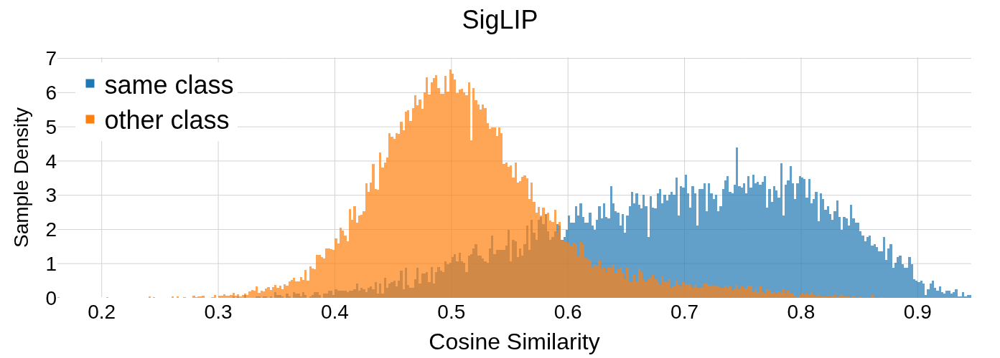

24172 24172 24172


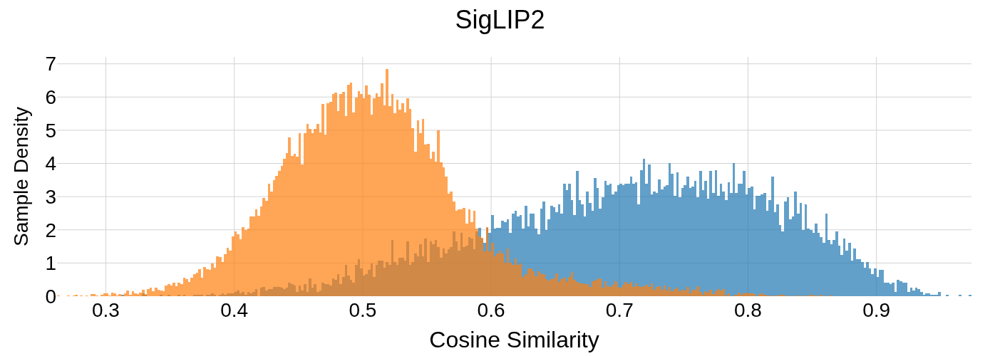

In [270]:
fig = plot_by_class(by_class_sims_siglip[0], by_class_sims_siglip[1], 
                   title="SigLIP")
fig.show()
fig.write_image('/home/jonas/workspace/challenging/siglip_by_class.pdf', scale=2)  # High resolution PDF


fig = plot_by_class(by_class_sims_sigl2[0], by_class_sims_sigl2[1], 
                   title="SigLIP2")
fig.update_traces(showlegend=False)
fig.show()
fig.write_image("/home/jonas/workspace/challenging/siglip2_by_class.pdf", scale=2)  # High resolution PDF

By modality

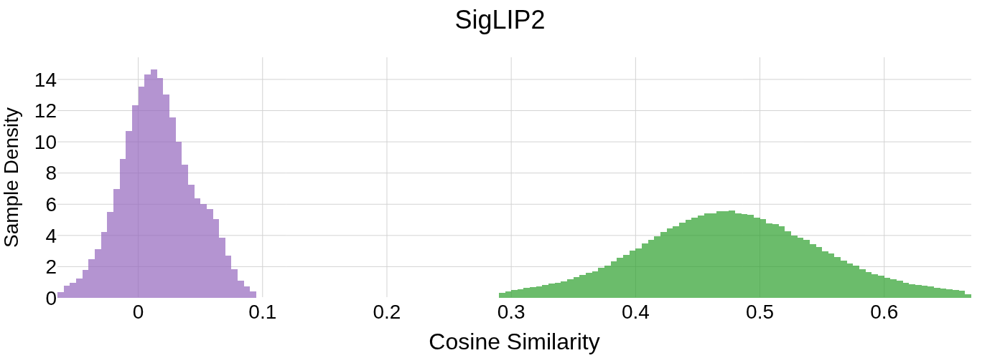

In [217]:
fig = plot_by_modality(by_mod_sims_siglip[0], by_mod_sims_siglip[1], 
                   title="SigLIP")
fig.show()
fig.write_image('/home/jonas/workspace/challenging/siglip_by_mod.pdf', scale=2)  # High resolution PDF


fig = plot_by_modality(by_mod_sims_sigl2[0], by_mod_sims_sigl2[1], 
                   title="SigLIP2")
fig.update_traces(showlegend=False)
fig.show()
fig.write_image('/home/jonas/workspace/challenging/siglip2_by_mod.pdf', scale=2)  # High resolution PDF

---
## Now same for the Cats vs Dogs dataset for section 2

In [ ]:
siglip_img_embeds = torch.load('/home/jonas/workspace/Cross-the-Gap/data/image_features/oxford_pets/ViT-B32/test/image_features.pt', map_location=torch.device(device)) #ViT-B16
siglip_txt_embeds = torch.load('/home/jonas/workspace/Cross-the-Gap/data/text_features/ViT-B/32//oxford_pets', map_location=torch.device(device))
sigl2_img_embeds = torch.load('/home/jonas/workspace/Cross-the-Gap/data/image_features/oxford_pets/ViT-B32/test/image_features.pt', map_location=torch.device(device)) #ViT-B16
sigl2_txt_embeds = torch.load('/home/jonas/workspace/Cross-the-Gap/data/text_features/ViT-B/32/oxford_pets', map_location=torch.device(device))

In [ ]:
print(siglip_img_embeds.shape, siglip_txt_embeds.shape, sigl2_img_embeds.shape, sigl2_txt_embeds.shape)

In [ ]:
labels = torch.cat([torch.tensor([[i]*99 for i in range(37)]).flatten(), torch.tensor([37,37,37,37,37,37])]) # not exactly right
labels.shape

In [ ]:
siglip_embs = F.normalize(siglip_img_embeds)
sigl2_embs = F.normalize(sigl2_img_embeds)
siglip_txt_embeds = F.normalize(siglip_txt_embeds)
sigl2_txt_embeds = F.normalize(sigl2_txt_embeds)

simmat_siglip = siglip_embs @ siglip_embs.T # ~2GB
simmat_siglip = simmat_siglip.cpu()

simmat_sigl2 = sigl2_embs @ sigl2_embs.T# ~2GB
simmat_sigl2 = simmat_sigl2.cpu()

print(simmat_siglip.shape, simmat_sigl2.shape)

In [ ]:
# by class
by_class_sims_siglip = group_sims_by_class(simmat_siglip, labels)
by_class_sims_sigl2 = group_sims_by_class(simmat_sigl2, labels)
# by modality
by_mod_sims_siglip = calc_sims_by_modality(siglip_embs, siglip_txt_embeds, labels)
by_mod_sims_siglip = remove_outliers(by_mod_sims_siglip[0]), remove_outliers(by_mod_sims_siglip[1])
by_mod_sims_sigl2 = calc_sims_by_modality(sigl2_embs, sigl2_txt_embeds, labels)
by_mod_sims_sigl2 = remove_outliers(by_mod_sims_sigl2[0]), remove_outliers(by_mod_sims_sigl2[1])

In [ ]:
fig = plot_by_class(by_class_sims_siglip[0], by_class_sims_siglip[1], 
                   title=None)
fig.show()
fig.write_image('/home/jonas/workspace/challenging/pets/siglip_by_class.pdf', scale=2)  # High resolution PDF


fig = plot_by_modality(by_mod_sims_siglip[0], by_mod_sims_siglip[1], 
                   title=None)
fig.show()
fig.write_image('/home/jonas/workspace/challenging/pets/siglip_by_mod.pdf', scale=2)  # High resolution PDF


## Actual cats&dogs dataset

In [309]:
from cddataset import CatDogDataset
import clip
from torch.utils.data import Dataset, DataLoader

device = "cuda" if torch.cuda.is_available() else "cpu"

dataset = CatDogDataset('/mnt/hdd/datasets/PetImages')
print(len(dataset))
dataloader = DataLoader(dataset, shuffle=False, batch_size=250, collate_fn=lambda x: x)

24998


In [310]:
#from algs import calc_simmat, fs_classification, measure_retrieval_map, measure_text_to_image_retrieval_map
import feat_extraction

clip_model, clippreprocess = clip.load("ViT-B/16", device=device)
with torch.no_grad():
    text_input = clip.tokenize(['a photo of a cat', 'a photo of a dog']).to(device)
    temb = clip_model.encode_text(text_input)
    temb = F.normalize(temb)

embs = feat_extraction.loop_clip(clip_model, clippreprocess, dataloader)

 51%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                                        | 51/100 [01:28<01:24,  1.71s/it]/home/jonas/miniforge3/envs/cross-the-gap/lib/python3.10/site-packages/PIL/TiffImagePlugin.py:949: UserWarning:

Truncated File Read

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [02:53<00:00,  1.73s/it]


In [313]:
embs.shape, len(dataset.labels), type(dataset.labels)

(torch.Size([24998, 512]), 24998, list)

In [351]:
indices_selected = sample_random_idcs(len(embs), ratio=1/10)
selected_embs = embs[indices_selected]
selected_labels = torch.tensor(dataset.labels)[indices_selected]
selected_embs.shape, selected_labels.shape

(torch.Size([2499, 512]), torch.Size([2499]))

In [352]:
len(indices_selected.unique())

2499

In [353]:
selected_embs = F.normalize(selected_embs).to(torch.float32) # float32 prevents spikes in histo!
simmat = selected_embs @ selected_embs.T
simmat = torch.triu(simmat)  # symmetric matrix, only use upper-right half to avoid duplicate values!
print(simmat.shape)

torch.Size([2499, 2499])


In [354]:
by_class_sims_cd = group_sims_by_class(simmat, selected_labels)
by_class_sims_cd = remove_outliers(by_class_sims_cd[0]), remove_outliers(by_class_sims_cd[1])
by_mod_sims_cd = calc_sims_by_modality(selected_embs, temb.cpu().to(torch.float32), selected_labels)
by_mod_sims_cd = remove_outliers(by_mod_sims_cd[0]), remove_outliers(by_mod_sims_cd[1])

400000 400000 400000


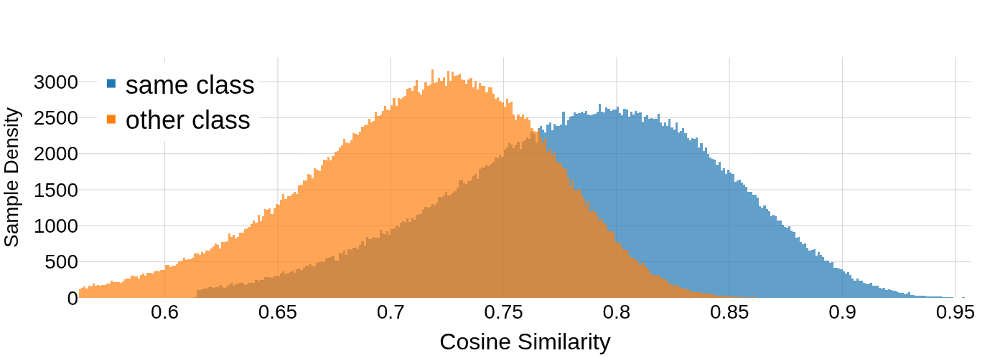

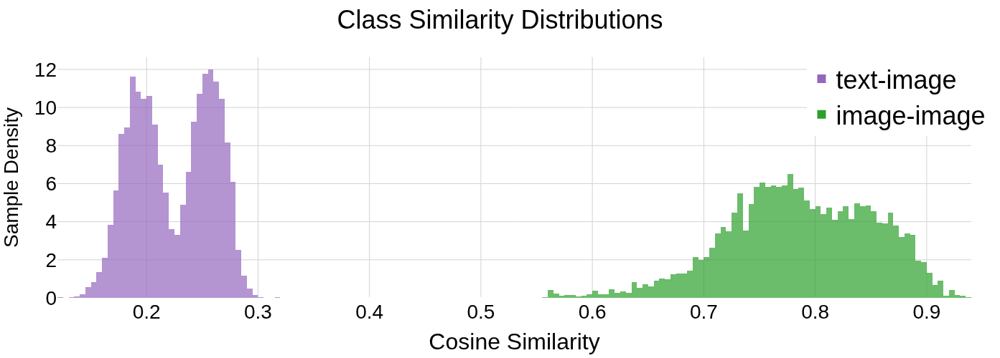

In [357]:
fig = plot_by_class(by_class_sims_cd[0], by_class_sims_cd[1], 
                   title=None)
fig.show()
fig.write_image('/home/jonas/workspace/challenging/catsanddogs/clipvitb16_by_class.pdf', scale=2)  # High resolution PDF


fig = plot_by_modality(by_mod_sims_cd[0], by_mod_sims_cd[1], 
                   title=None)
fig.show()
fig.write_image('/home/jonas/workspace/challenging/catsanddogs/clipvitb16_by_mod.pdf', scale=2)  # High resolution PDF